In [3]:
import numpy as np
import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt
import altair as alt

In [4]:
!jupyter lab --version

1.0.0a5


In [18]:
# import iopro.pyodbc as pyodbc
pd.options.display.max_columns = 1000
pd.options.display.max_rows = 200
pd.options.display.max_colwidth = 1000

# sns.set(style='whitegrid')
# sns.set_context(context='notebook', font_scale=1.5)

# Graphics in SVG format are more sharp and legible
%config InlineBackend.figure_format = 'svg'

In [19]:
df = pd.read_csv('wz_results_data/wz_results2014.csv')
df.head()

,wz_id,avg_wz_delay,max_wz_delay,total_wz_delay,avg_am_delay,max_am_delay,total_am_delay,wz_am_lottr,avg_mid_delay,max_mid_delay,total_mid_delay,wz_mid_lottr,avg_pm_delay,max_pm_delay,total_pm_delay,wz_pm_lottr,avg_weekend_delay,max_weekend_delay,total_weekend_delay,wz_weekend_lottr,max_queue_length,num_queue,total_queue_duration,max_queue_duration,wz_lottr,time_taken,county,road,category,direction,speed,wz_start,wz_end,start_mm,end_mm,tmc_count,wz_duration
0,57973,0.257360,7.943611,1164.946034,0.885616,7.943611,290.379914,1.054281,0.490151,3.868032,291.114972,1.043664,0.422731,6.759641,201.320499,1.048674,0.000000,1.813056,36.437399,1.011347,0.000000,0.0,0.0,0.0,1.039062,158.992954,Macomb County,I-94,Shoulder Closure,Eastbound,70,2014-01-06T12:00:00Z,2014-01-12T23:00:00Z,257.086293,270.882097,13,155.0
1,58121_2,0.730808,20.399221,2551.476425,1.540802,7.200835,403.235553,1.097282,0.941530,9.681833,454.932235,1.110490,2.381752,20.399221,851.999736,1.171826,0.183705,1.098028,72.818547,1.022788,4.235862,8.0,335.0,115.0,1.154886,308.100136,Macomb County,I-94,Shoulder Closure,Eastbound,70,2014-01-06T12:00:00Z,2014-01-12T23:00:00Z,225.710404,228.987383,31,155.0
2,58122_2,0.311223,7.107770,1435.737326,0.925106,5.488907,284.193455,1.050463,0.574029,5.130233,321.107733,1.058310,0.760415,5.693380,250.129610,1.056755,0.000000,1.783080,35.981164,1.012259,0.000000,0.0,0.0,0.0,1.057927,154.625662,Macomb County,I-94,Shoulder Closure,Eastbound,70,2014-01-06T12:00:00Z,2014-01-12T23:00:00Z,243.260280,257.456120,13,155.0
3,58123,0.587366,19.850262,2330.688297,1.417203,8.341462,396.314395,1.072203,0.659571,9.789736,379.334563,1.072751,1.810303,19.850262,676.546262,1.133206,0.030405,1.235984,52.056251,1.015368,4.235862,3.0,125.0,70.0,1.100388,264.005249,Macomb County,I-94,Shoulder Closure,Eastbound,70,2014-01-06T12:00:00Z,2014-01-12T23:00:00Z,231.756632,243.780846,28,155.0
4,58124,2.323270,41.551808,10091.481720,7.360915,39.011252,2474.326730,1.636411,4.234357,41.551808,2317.245015,1.366237,11.655799,40.771918,3355.525089,1.477693,0.000000,6.895028,104.225272,1.028467,5.933702,29.0,1795.0,310.0,1.553644,349.875405,Macomb County,I-75,Shoulder Closure,Northbound,70,2014-01-06T13:00:00Z,2014-01-12T23:00:00Z,49.487994,53.061950,37,154.0


In [4]:
df.shape

(638, 37)

In [5]:
df = df[['total_wz_delay', 'avg_wz_delay', 'max_wz_delay', 'max_queue_duration', 'total_queue_duration', 'num_queue', 'max_queue_length',
             'wz_id', 'category', 'county', 'road', 'direction', 'speed', 'wz_start', 'wz_end', 'start_mm', 'end_mm', 'tmc_count', 'wz_duration']].dropna()
df['category'] = pd.Categorical(values = df['category'], categories = ['Shoulder Closure', 'Single Lane Closure', 'Double Lane Closure',
       'Multiple Lane Closure'])

# total_wz_delay
df2 = df.sort_values(by='total_wz_delay', ascending=False)
df2 = df2.reset_index(drop=True).reset_index()

In [6]:
df2.head()

,index,total_wz_delay,avg_wz_delay,max_wz_delay,max_queue_duration,total_queue_duration,num_queue,max_queue_length,wz_id,category,county,road,direction,speed,wz_start,wz_end,start_mm,end_mm,tmc_count,wz_duration
0,0,10091.481720,2.323270,41.551808,310.0,1795.0,29.0,5.933702,58124,Shoulder Closure,Macomb County,I-75,Northbound,70,2014-01-06T13:00:00Z,2014-01-12T23:00:00Z,49.487994,53.061950,37,154.0
1,1,8899.264924,0.551742,73.962062,705.0,1375.0,4.0,7.256744,70000,Single Lane Closure,Kent County,I-96,Westbound,70,2014-08-23T02:00:00Z,2014-08-25T09:00:00Z,54.000000,50.000000,6,55.0
2,2,5384.293770,1.936029,36.115275,750.0,1470.0,12.0,6.053285,67988,Double Lane Closure,Wayne County,I-75,Southbound,70,2014-07-12T01:00:00Z,2014-07-14T09:00:00Z,39.000000,33.000000,23,56.0
3,3,4155.726330,0.490321,61.052171,190.0,960.0,22.0,5.124032,59599_1,Shoulder Closure,Wayne County,I-75,Northbound,70,2014-02-17T14:00:00Z,2014-02-21T20:00:00Z,51.674659,61.102122,47,102.0
4,4,4097.812867,1.103452,49.108797,590.0,1055.0,9.0,6.268528,65627,Double Lane Closure,Wayne County,I-75,Northbound,70,2014-05-31T00:00:00Z,2014-06-02T09:00:00Z,34.011807,38.499262,20,57.0


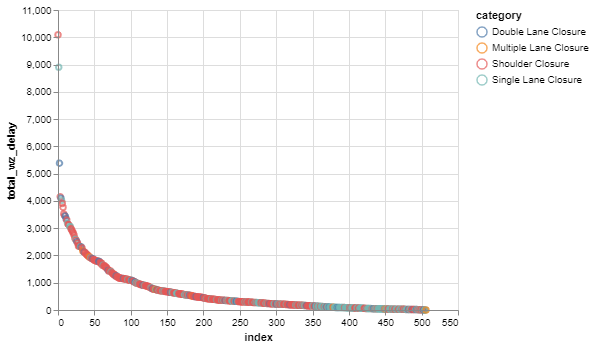

In [7]:
alt.Chart(df2).mark_point().encode(
    x='index',
    y='total_wz_delay',
    color = 'category',
    tooltip=['wz_id', 'category', 'county', 'road', 'direction']
)

In [8]:
base = alt.Chart(df2).mark_circle().encode(
    x='index:Q',
    y='total_wz_delay:Q',
).properties(
    width=1000,
    height=300
)

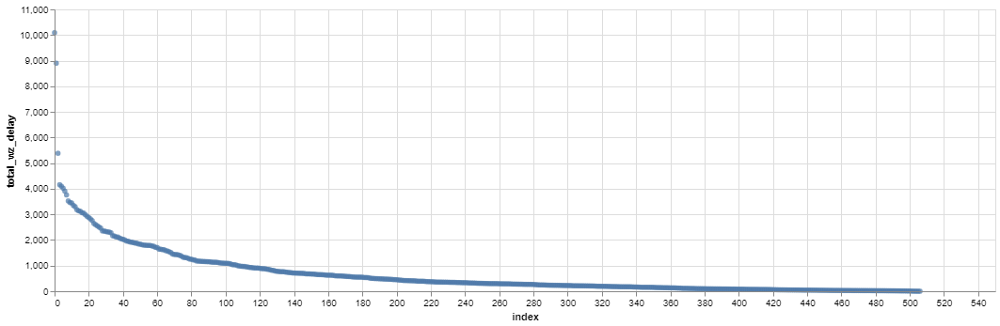

In [9]:
base

In [10]:
chart = base.encode(color = 'category:N',
                    tooltip=['wz_id', 'category', 'county', 'road', 'direction'],
                    opacity=alt.value(0.8)).properties(
    title='')

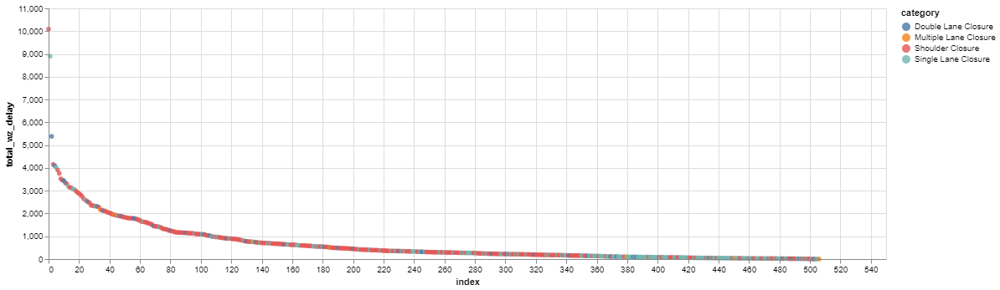

In [11]:
chart

In [12]:
chart = chart.encode(
    column='category:N'
    ).properties(
        width=250,
        height=250
    ).properties(
        title='2014'
    )

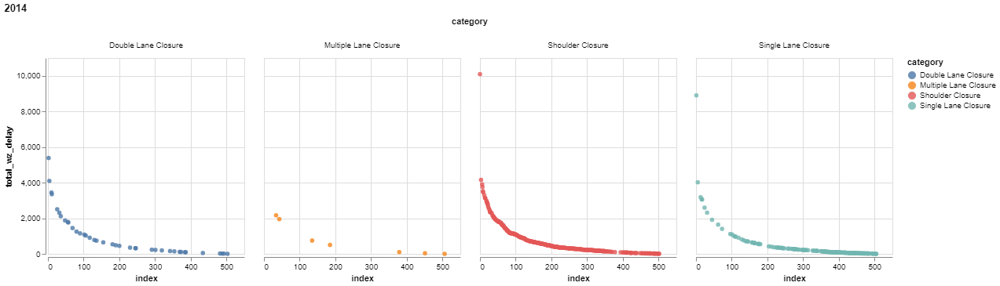

In [13]:
chart

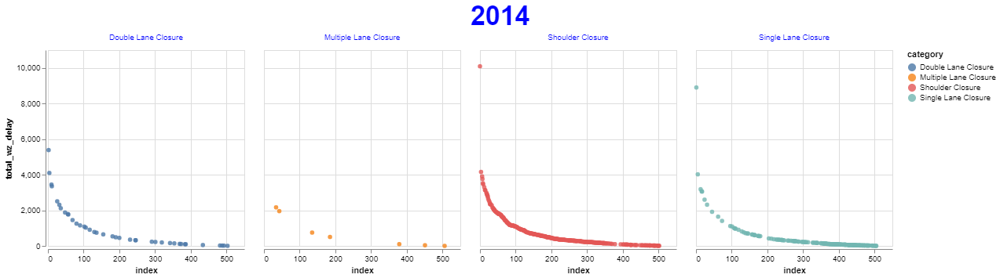

In [16]:
chart.\
    configure_header(
        title = None,
        titleFontSize=34,
        titleFont='Courier',
        titleAnchor='middle',
        labelColor='blue'
    ).\
    configure_title(
        fontSize=34,
        anchor='middle',
        color='blue')

In [ ]:
df = pd.read_csv('wz_results_data/wz_results2014.csv')
df.head()

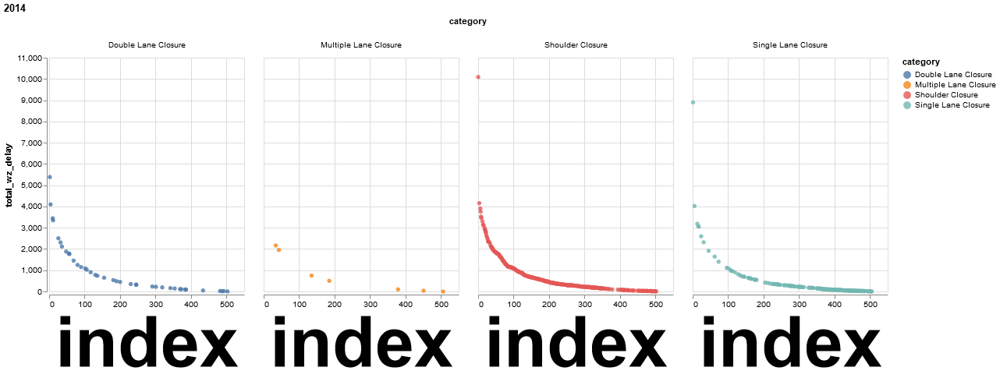

In [148]:
chart.configure_axis(titleFontSize= 90)

In [177]:
chart.save('chart.png', scale_factor=2.0)

WebDriverException: Message: 'chromedriver' executable needs to be in PATH. Please see https://sites.google.com/a/chromium.org/chromedriver/home


In [149]:
# !conda list

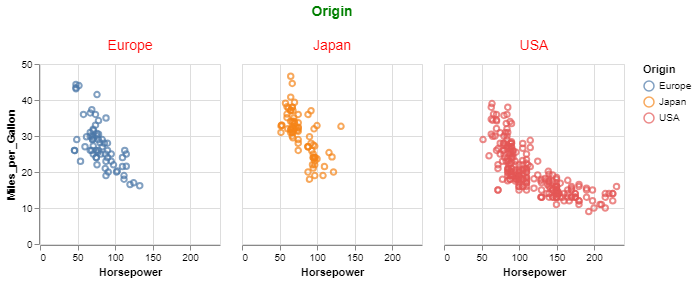

In [1]:
import altair as alt
from vega_datasets import data

source = data.cars.url

chart = alt.Chart(source).mark_point().encode(
    x='Horsepower:Q',
    y='Miles_per_Gallon:Q',
    color='Origin:N',
    column='Origin:N'
).properties(
    width=180,
    height=180
)

chart.configure_header(
    titleColor='green',
    titleFontSize=14,
    labelColor='red',
    labelFontSize=14
)

In [5]:
chart.save('chart.png', scale_factor=3.0)

In [3]:
chart.save('chart2.svg', scale_factor=2.0)

In [158]:
pd.read_json(data.cars.url).head()

,Acceleration,Cylinders,Displacement,Horsepower,Miles_per_Gallon,Name,Origin,Weight_in_lbs,Year
0,12.0,8,307.0,130.0,18.0,chevrolet chevelle malibu,USA,3504,1970-01-01
1,11.5,8,350.0,165.0,15.0,buick skylark 320,USA,3693,1970-01-01
2,11.0,8,318.0,150.0,18.0,plymouth satellite,USA,3436,1970-01-01
3,12.0,8,304.0,150.0,16.0,amc rebel sst,USA,3433,1970-01-01
4,10.5,8,302.0,140.0,17.0,ford torino,USA,3449,1970-01-01


In [159]:
chart = alt.Chart(df2).mark_point().encode(
    x='index:Q',
    y='total_wz_delay:Q',
    color='category:N',
    column='category:N'
).properties(
    width=180,
    height=180
)


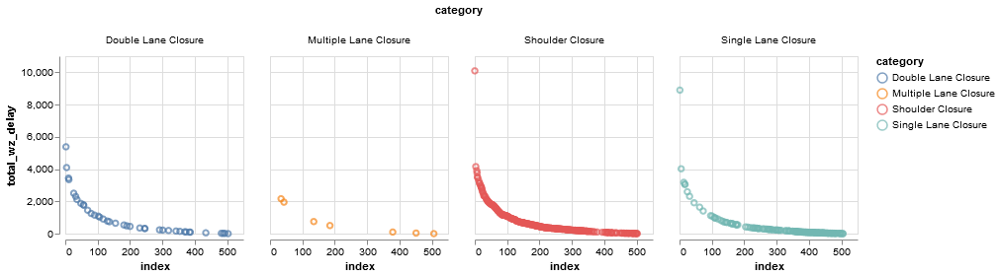

In [160]:
chart

# Combined years analysis

In [7]:
df = pd.read_csv('wz_results_data/wz_results_combi.csv')

In [8]:
df = df[['total_wz_delay', 'avg_wz_delay', 'max_wz_delay', 'max_queue_duration', 'total_queue_duration', 'num_queue', 'max_queue_length',
             'wz_id', 'category', 'county', 'road', 'direction', 'speed', 'wz_start', 'wz_end', 'start_mm', 'end_mm', 'tmc_count', 'wz_duration', 'lat', 'lon', 'year']].dropna()
df['category'] = pd.Categorical(values = df['category'], categories = ['Shoulder Closure', 'Single Lane Closure', 'Double Lane Closure',
       'Multiple Lane Closure'])

# total_wz_delay
df2 = df.sort_values(by='total_wz_delay', ascending=False)
df2 = df2.reset_index(drop=True).reset_index()

In [9]:
df2.head()

,index,total_wz_delay,avg_wz_delay,max_wz_delay,max_queue_duration,total_queue_duration,num_queue,max_queue_length,wz_id,category,county,road,direction,speed,wz_start,wz_end,start_mm,end_mm,tmc_count,wz_duration,lat,lon,year
0,0,14634.770899,0.656701,49.930747,550.0,6035.0,63.0,6.341538,114914,Single Lane Closure,Oakland County,I-696,Eastbound,70,2017-09-19 13:00:00,2017-10-03 01:00:00,11.000000,13.00000,16,324.000000,42.484755,-83.235069,2017
1,1,10091.481720,2.323270,41.551808,310.0,1795.0,29.0,5.933702,58124,Shoulder Closure,Macomb County,I-75,Northbound,70,2014-01-06 13:00:00,2014-01-12 23:00:00,49.487994,53.06195,37,154.000000,42.341933,-83.076010,2014
2,2,9537.371106,0.859474,64.269638,480.0,2355.0,18.0,5.778698,94261,Double Lane Closure,Wayne County,I-75,Southbound,70,2015-11-15 23:00:00,2015-11-23 14:34:00,46.000000,42.00000,31,183.566667,42.304252,-83.110407,2015
3,3,9496.469722,0.875525,64.269638,480.0,2355.0,18.0,5.778698,93622,Double Lane Closure,Wayne County,I-75,Southbound,70,2015-11-15 23:00:00,2015-11-23 09:00:00,46.000000,42.00000,31,178.000000,42.304252,-83.110407,2015
4,4,8899.264924,0.551742,73.962062,705.0,1375.0,4.0,7.256744,70000,Single Lane Closure,Kent County,I-96,Westbound,70,2014-08-23 02:00:00,2014-08-25 09:00:00,54.000000,50.00000,6,55.000000,42.879384,-85.328247,2014


In [10]:
base = alt.Chart(df2).mark_circle().encode(
    x='index:Q',
    y='total_wz_delay:Q',
).properties(
    width=1000,
    height=300
)

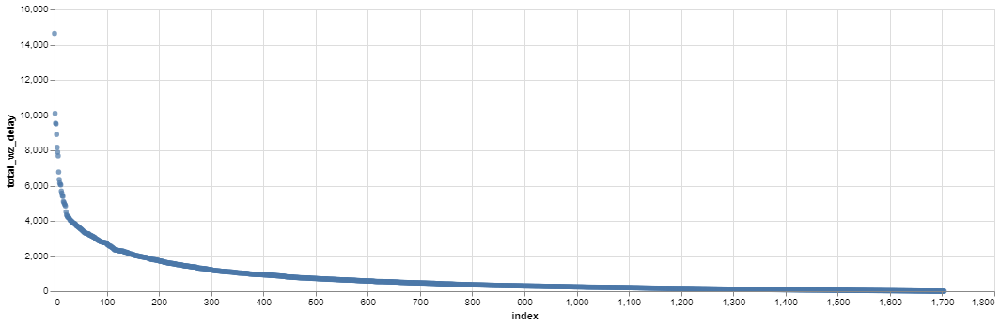

In [11]:
base

In [12]:
chart = base.encode(color = 'category:N',
                    tooltip=['wz_id', 'category', 'county', 'road', 'direction', 'lat', 'lon', 'year'],
                    opacity=alt.value(0.8)).properties(
    title='')

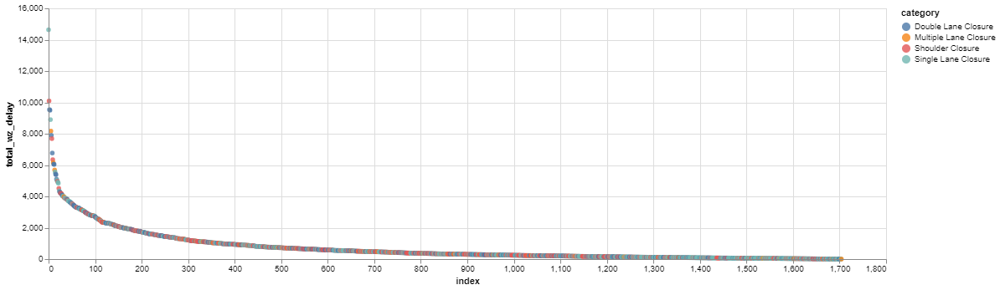

In [13]:
chart

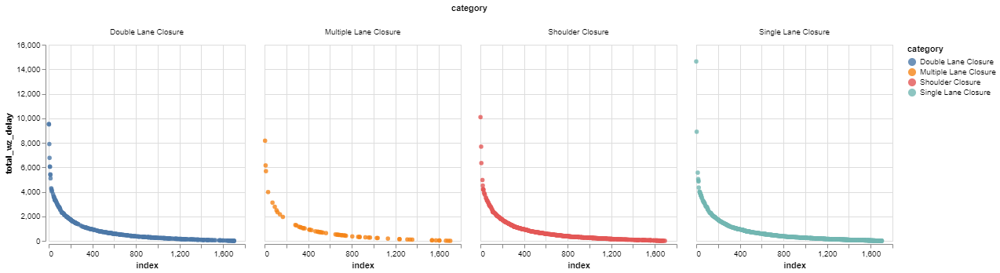

In [14]:
chart.encode(
    column='category:N'
    ).properties(
        width=250,
        height=250
)
#     ).properties(
#         title='2014'
#     )

In [15]:
chart_facet = chart.encode(
    column='category:N',
    row = 'year:N',
    
    ).properties(
    title='Total Work Zone Delay',
        width=250,
        height=250
)

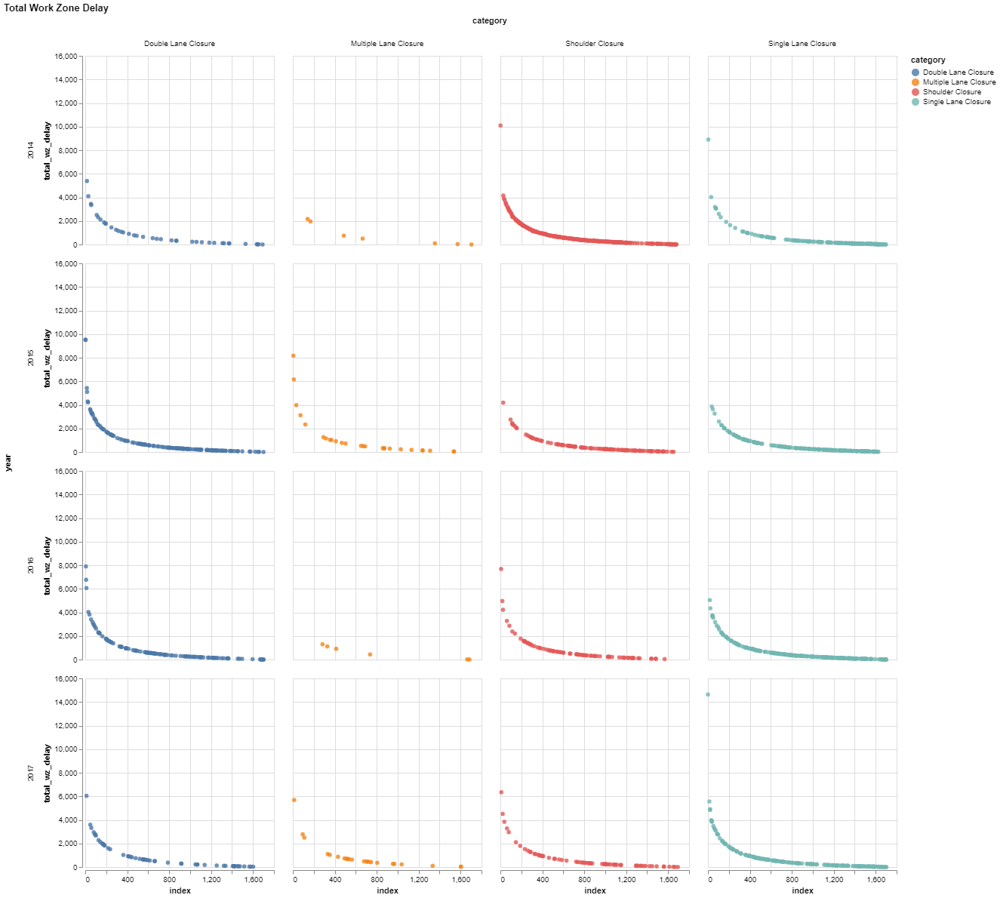

In [16]:
chart_facet

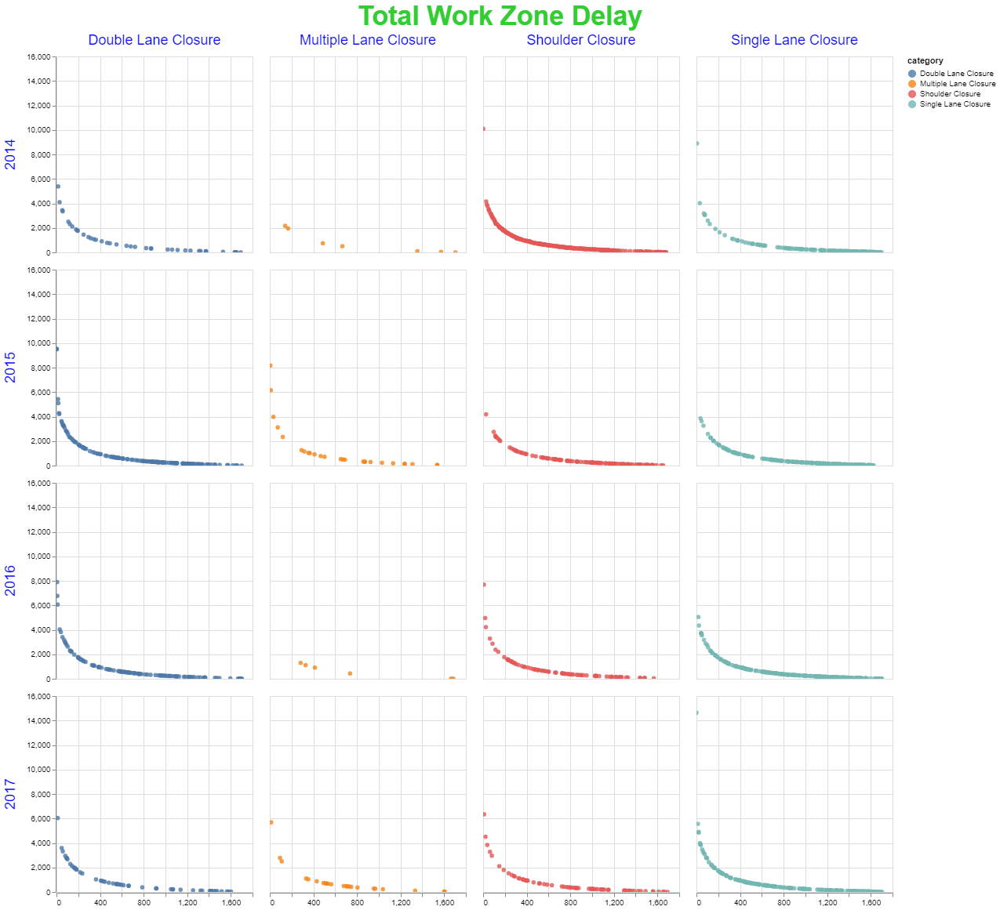

In [17]:
chart_facet.\
    configure_axisLeft(title=None).\
    configure_axisBottom(title=None).\
    configure_header(
        title = None,
        titleFontSize=34,
        titleFont='Courier',
        titleAnchor='middle',
        labelColor='blue',
        labelFontSize= 18).\
    configure_title(
        fontSize=34,
        anchor='middle',
        color='limegreen').\
    interactive()

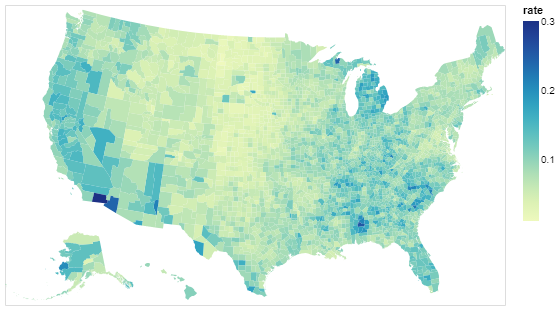

In [63]:
import altair as alt
from vega_datasets import data

counties = alt.topo_feature(data.us_10m.url, 'counties')
source = data.unemployment.url

alt.Chart(counties).mark_geoshape().encode(
    color='rate:Q'
).transform_lookup(
    lookup='id',
    from_=alt.LookupData(source, 'id', ['rate'])
).project(
    type='albersUsa'
).properties(
    width=500,
    height=300
)

In [72]:
from vega_datasets import data

In [157]:
data.unemployment().sample(5)

,id,rate
592,17001,0.079
295,8105,0.048
91,2280,0.098
1710,31119,0.042
575,16055,0.087


In [77]:
counties = alt.topo_feature(data.us_10m.url, 'counties')

In [92]:
counties.url

'https://vega.github.io/vega-datasets/data/us-10m.json'

In [83]:
data.us_10m.description

In [96]:
# pd.read_table(counties.url)

In [85]:
data.us_10m.url

'https://vega.github.io/vega-datasets/data/us-10m.json'

In [98]:
data.us_10m.description

In [99]:
data.us_10m.is_local

False

In [ ]:
data.us_10m()

In [105]:
alt.topo_feature(data.us_10m.url, feature='counties')

UrlData({
  format: TopoDataFormat({
    feature: 'state',
    type: 'topojson'
  }),
  url: 'https://vega.github.io/vega-datasets/data/us-10m.json'
})

In [111]:
alt.topo_feature('https://github.com/deldersveld/topojson/blob/master/countries/us-states/MI-26-michigan-counties.json', feature='states')

UrlData({
  format: TopoDataFormat({
    feature: 'states',
    type: 'topojson'
  }),
  url: 'https://github.com/deldersveld/topojson/blob/master/countries/us-states/MI-26-michigan-counties.json'
})

In [117]:
data.us_10m.url

'https://vega.github.io/vega-datasets/data/us-10m.json'

In [108]:
data.airports.description

'This dataset lists US airports, including airport code, city, state, latitude, and longitude. This dataset is a subset of the data compiled and published at http://ourairports.com/data/, and is in the public domain.'

In [155]:
data.airports().head()

,iata,name,city,state,country,latitude,longitude
0,00M,Thigpen,Bay Springs,MS,USA,31.953765,-89.234505
1,00R,Livingston Municipal,Livingston,TX,USA,30.685861,-95.017928
2,00V,Meadow Lake,Colorado Springs,CO,USA,38.945749,-104.569893
3,01G,Perry-Warsaw,Perry,NY,USA,42.741347,-78.052081
4,01J,Hilliard Airpark,Hilliard,FL,USA,30.688012,-81.905944


In [15]:
url = 'https://github.com/deldersveld/topojson/blob/master/countries/us-states/MI-26-michigan-counties.json'
url = 'https://raw.githubusercontent.com/deldersveld/topojson/master/countries/us-states/MI-26-michigan-counties.json'

In [16]:
url

'https://raw.githubusercontent.com/deldersveld/topojson/master/countries/us-states/MI-26-michigan-counties.json'

In [17]:
source = alt.topo_feature(url, feature='cb_2015_michigan_county_20m')
source

UrlData({
  format: TopoDataFormat({
    feature: 'cb_2015_michigan_county_20m',
    type: 'topojson'
  }),
  url: 'https://raw.githubusercontent.com/deldersveld/topojson/master/countries/us-states/MI-26-michigan-counties.json'
})

In [18]:
background = alt.Chart(source).\
    mark_geoshape(
        fill='lightgray',
        stroke='white').\
    encode(tooltip='properties.NAME:N').\
    properties(
        width=500,
        height=500)# .project('albersUsa')#.properties(projection = {'type': 'identity', 'reflectY': True})

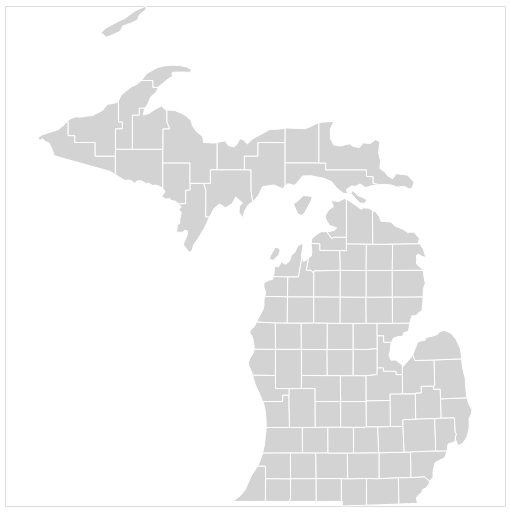

In [19]:
background

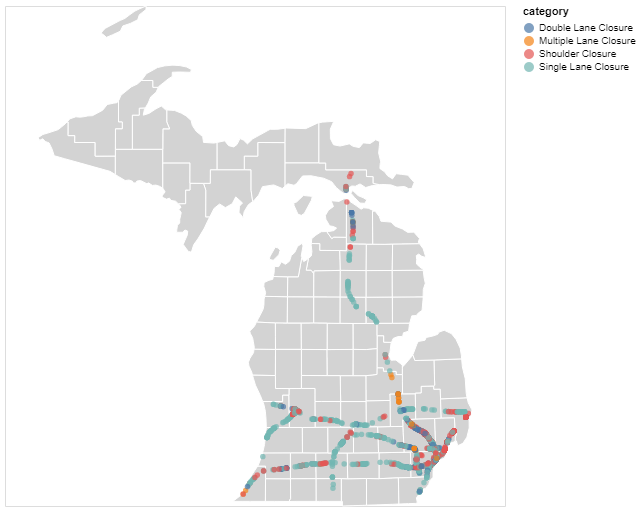

In [20]:
points = alt.Chart(df2).mark_circle().encode(
    longitude='lon:Q',
    latitude='lat:Q',
    tooltip=['wz_id', 'category', 'county', 'road', 'direction', 'lat', 'lon', 'year'],
    color='category:N')

(background + points)

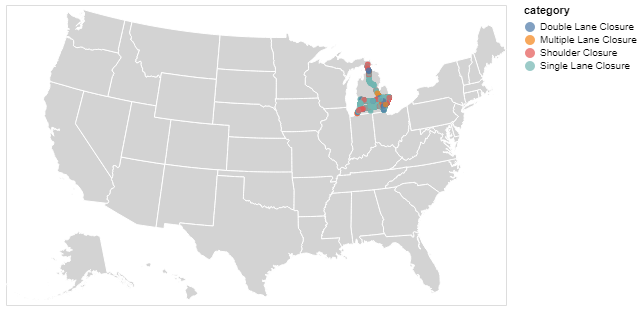

In [21]:
import altair as alt
from vega_datasets import data

airports = data.airports.url
states = alt.topo_feature(data.us_10m.url, feature='states')

# US states background
background = alt.Chart(states).mark_geoshape(
    fill='lightgray',
    stroke='white'
).properties(
    width=500,
    height=300
).project('albersUsa')


points = alt.Chart(df2).mark_circle().encode(
    longitude='lon:Q',
    latitude='lat:Q',
    tooltip=['wz_id', 'category', 'county', 'road', 'direction', 'lat', 'lon', 'year'],
    color='category:N')

(background + points)

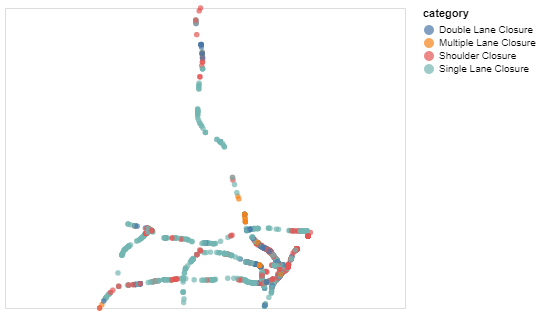

In [111]:
alt.Chart(df2).mark_circle().encode(
    longitude='lon:Q',
    latitude='lat:Q',
    tooltip=['wz_id', 'category', 'county', 'road', 'direction', 'lat', 'lon', 'year'],
    color='category:N')#.interactive()

In [105]:
base = alt.Chart(df2).mark_circle().encode(
    x='lon:Q',
    y='lat:Q',
    color='category:N',
    tooltip=['wz_id', 'category', 'county', 'road', 'direction', 'lat', 'lon', 'year'],
).interactive()

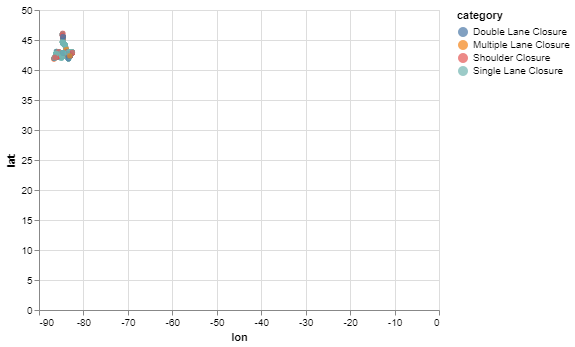

In [106]:
base

In [33]:
import folium

In [64]:
f = folium.Figure(width=600, height=800)

m = folium.Map(location=[df['lat'].mean(), df['lon'].mean()], 
               zoom_start=7,
               min_lat=df['lat'].min()-0.5, 
               max_lat=df['lat'].max()+0.5, 
               min_lon=df['lon'].min()-0.5, 
               max_lon=df['lon'].max()+0.5,
              max_bounds =False)

f.add_child(m)

In [96]:
def add_marker(row):
    marker = folium.CircleMarker(location=[row['lat'], row['lon']],
                             radius=2,
                            popup= row.wz_id)
    marker.add_to(m)

In [98]:
row = df.iloc[0]
df2.iloc[0:500, :].apply(add_marker, axis=1)
m

In [95]:
m

In [16]:
import altair as alt

url = "https://raw.githubusercontent.com/deldersveld/topojson/master/countries/us-states/MI-26-michigan-counties.json"

source = alt.topo_feature(url, feature="cb_2015_michigan_county_20m")

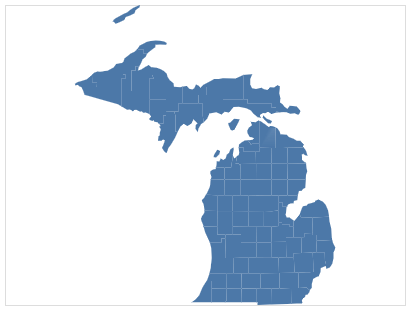

In [17]:

alt.Chart(source).mark_geoshape().encode(
    tooltip='properties.NAME:N'
)

In [ ]:
nearest = alt.selection(type='single', nearest=True, on='mouseover',
                        fields=['x'], empty='none')

In [ ]:
nearest